## PUTSAFIRST

------------------------------------------------
### POSITIONAL ANALYSIS


Positional analysis is a subfield of network science concerned with the identification of actors or groups of actors who occupy similar positions or roles based on some feature or structure of the network.


#### Data Source



*#PutSAFirst Reply Network - Largest Component*



#### Data Transformation


Missing data are typically handled poorly by this type of clustering algorithm, therefore I exclude observations with any missing data from the feature dataset. Additionally, to standardise the data, I use a data scaling method called "MinMaxScaler" that is careful to not assume the shape of the selected features as normally distributed.



#### Method



Using pythons scikit-learn library, I present feature based techniques that detect optimal **k-means algorithm** clusters.


In [1]:
#
#import import_ipynb
#import os
import pandas as pd
import numpy as np
from scipy import stats
import igraph as ig
import matplotlib.pyplot as plt
import plotly.express as px
from operator import itemgetter
import seaborn as sns 
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from kneed import KneeLocator
import random
from numpy import random as nprando
from IPython.display import Image, SVG, HTML, display

#########################################################################################

##SETUP##
sns.set()
nprando.seed(111)
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'figure.figsize': (12, 8)})
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

##FUNCTIONS##
# Independent Cascade Model
def ic(G,s,d=[], a=[]):
    #print(s)
    jst_inf=list(s)
    infected=list(s)
    #flag = True
    while(1):
        #print(jst_inf, infected)
        # iteration ends when jst_infected list becomes empty
        if len(jst_inf)==0:
            return infected
            #flag = False
        tmp=[]
        for each in jst_inf:
            for each1 in G.neighbors(each, mode='all'):
                r = random.uniform(0,1)
                # if node in Spreader role, do not infect node
                if each1 in d:
                    r=0
                # if node in Activator role, do not infect node
                if each1 in a:
                    r=0    
                # if node has random number less than 0.5, infect node
                if r>0.5 and each1 not in infected and each1 not in tmp:
                    tmp.append(each1)
            # overall infected nodes
            infected.append(each)
        # infected nodes in current iteration
        jst_inf=list(tmp)
        
##VARIABLES##
e_feat = "putsafirst_features_1.csv"
range_1 = range(2,30)
range_2 = range(2,30)
n_clust = 9
clust_sel = [2,6,8]

#########################################################################################

##LOAD DATA##
df_sen_1 = pd.read_csv(e_feat, sep=";", dtype={'id': str})
#df_sen_1.describe()  

# Drop data with missing observations
# Typically would impute missing data however this is data of users who did not tweet once in the dataset however were replied to 
df_null_1 = df_sen_1[df_sen_1.isna().any(axis=1)]
#df_null_1.describe()
df_sen_1 = df_sen_1.dropna()
df_sen_1.reset_index(inplace=True)
#df_sen_1.describe() #changes are less than std increase to mean


--------------------------------------
#### 1. SELECTION


###### Feature Correlation



The 16 features selected for this analysis are detailed in the Part I: Descriptive Analysis. They cover node attributes of expansiveness (whether someone is a social butterfly or wallflower), attractiveness (whether someone is popular or unpopular), as well as relevance (whether someone is locally important or important gloably). For example, a person can be generally active on social media with a high number of tweets, while another person can be active with a high number of tweets at one particular point in time discussing one particular issue. Both of these traits are captured by the features: *tweets* (global) and *#tweeted* (local).

Notable observations from the correlation matrix: 

- *#liked* number of tweets and being *listed* on someone's public lists is positively correlated with the number of *followers*.

- *#liked* number of tweets are positively correlated with the *indegree* of your tweets being replied to as well as the *pagerank* likelihood of being connected to other high rank positions.

- *#tweeted*, *reciprocity*, *hierarchy* are all positively correlated with the *outdegree* of replying to tweets and the *indegree* of your tweets being replied to.




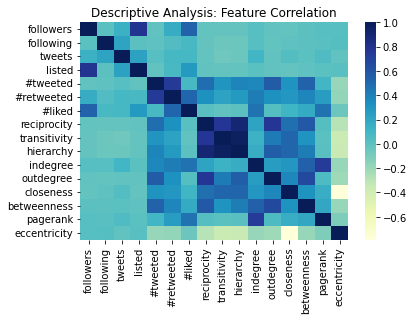

In [2]:
#
# K-MEANS CLUSTERING

feat_cols = ['followers', 'following','tweets','listed','#tweeted','#retweeted','#liked','reciprocity','transitivity','hierarchy', 'indegree', 'outdegree', 'closeness', 'betweenness', 'pagerank', 'eccentricity']
df_feat = df_sen_1.loc[:,feat_cols]

df_corr = df_feat
feat_corr = df_corr.corr()
plt.rcParams["figure.figsize"]=[10,5]
sns.heatmap(feat_corr, annot = False, cmap='YlGnBu')
plt.title('Descriptive Analysis: Feature Correlation')
#plt.savefig("{}".format(gpath) + x + "_feature_correlation_wr.png")
plt.show()

In [3]:
#
# DATA TRANSFORMATION
# Impute missing data
#imputer = KNNImputer(n_neighbors=3)
#imputer.fit_transform(df_feat)

# Standardizing the data
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df_feat)

# The StandardScaler class implements a type of feature scaling called standardization. Standardization scales, or shifts, the values for each numerical feature in your dataset so that the features have a mean of 0 and standard deviation of 1
# The pipeline will implement an alternative to the StandardScaler class called MinMaxScaler for feature scaling. 
# You use MinMaxScaler when you do not assume that the shape of all your features follows a normal distribution.
# An alternative to the StandardScaler class called MinMaxScaler for feature scaling. 
# You use MinMaxScaler when you do not assume that the shape of all your features follows a normal distribution.

# Statistics of scaled data
#pd.DataFrame(scaled_feat).describe()

-------------------------------------------------------------------------
#### 2. DETECTION

Using k-means clustering techniques, I detect the optimal number of clusters to fit the network data.


#### 2.1. The Elbow Method


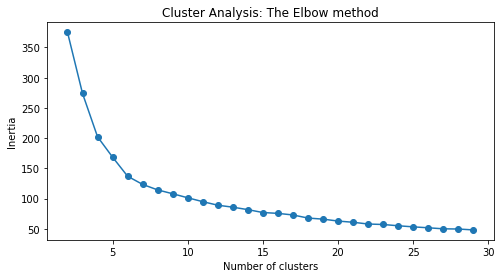

In [4]:
#
# CLUSTER DETECTION
# The Elbow method is the most popular in finding an optimum number of clusters, this method uses WCSS (Within Clusters Sum of Squares) which accounts for the total variations within a cluster.
# Elbow curve, where the x-axis will represent the number of clusters and the y-axis will be an evaluation metric. Let’s say inertia for now.
# You can choose any other evaluation metric like the Dunn index as wel
# Defining the kmeans function with initialization as k-means++
# Fitting multiple k-means algorithms and storing the values in an empty list

#range_1 = range(2,30)
#range_2 = range(2,30)

WCSS=[]
for cluster in range_1:
    kmeans = KMeans(n_clusters=cluster, init='k-means++')
    kmeans.fit(scaled_feat)
    wcss_iter = kmeans.inertia_ 
    WCSS.append(wcss_iter)

# Converting the results into a dataframe and plotting them
# The quality of the cluster assignments is determined by computing the sum of the squared error (SSE) after the centroids converge, or match the previous iteration’s assignment. 
# The SSE is defined as the sum of the squared Euclidean distances of each point to its closest centroid. 
# Since this is a measure of error, the objective of k-means is to try to minimize this value
frame = pd.DataFrame({'Cluster':range_1,'WCSS':WCSS})
plt.rcParams["figure.figsize"]=[8,4]
#plt.rcParams["figure.autolayout"] =True
plt.plot(frame['Cluster'], frame['WCSS'], marker='o')
plt.title('Cluster Analysis: The Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
#plt.savefig("{}".format(gpath) + x + "_cluster_elbow_wr.png")
plt.show()

# As the number of clusters increases, the variance (within-cluster sum of squares) decreases. 

**KneeLocator**

Since it is not visibly clear, just by looking, which point of the curve is the knee or point of the maximum curvature. I run the *kneelocator* function and find the optimum number of clusters at at k-cluster=7.

In [5]:
#
#Find the knee or point of curve (point of maximum curvature)
kl = KneeLocator(range_1, WCSS, curve="convex", direction="decreasing")
kl.elbow

7

#### 2.2. The Silhouette Method


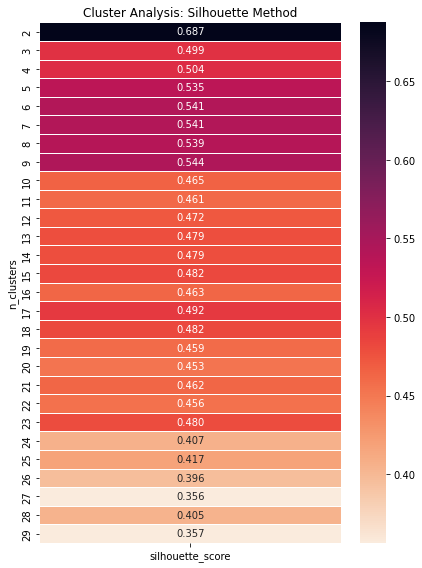

In [6]:
#
#SILHOUETTE METHOD
#The silhouette coefficient is a measure of cluster cohesion and separation. 
#It quantifies how well a data point fits into its assigned cluster based on two factors:
#1.How close the data point is to other points in the cluster
#2.How far away the data point is from points in other clusters
#Silhouette coefficient values range between -1 and 1. 
#Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range_2:
    kmeans = KMeans(init='k-means++',n_clusters=k, n_init=100, random_state=0)
    kmeans_labels = kmeans.fit_predict(scaled_feat)
    silhouette_avg = silhouette_score(scaled_feat, kmeans_labels)
    silhouette_coefficients.append([k,silhouette_avg])

result = pd.DataFrame(silhouette_coefficients, columns=["n_clusters","silhouette_score"])
pivot_km = pd.pivot_table(result, index="n_clusters", values="silhouette_score")

plt.rcParams.update({'figure.figsize': (6, 8)})
#plt.rcParams["figure.autolayout"] =True
plt.figure()
sns.heatmap(pivot_km, annot=True, linewidths=.5, fmt='.3f', cmap=sns.cm.rocket_r)
plt.title('Cluster Analysis: Silhouette Method')
plt.tight_layout()
#plt.savefig("{}".format(gpath) + x + "_cluster_silhouette_wr.png")
plt.show()

The highest silhouette score obtained for k-clusters between 2 and 30 is 0.687 at k-cluster=2.

--------------------------------------------------------------------------
#### 3. CLASSIFICATION




Using the elbow and silhouette method as a guide, I narrow the range of k-clusters and carefully examine the groupings that display the most consisent and meaningful result. I find k-cluster=9 to have the best grouping for this network data. 

I classify the different clusters by plotting the mean scores of each feature in a cluster and comparing them to the mean scores of features in other clusters. Distinct clusters are identified by the features that display the largest deviation from the mean score. 


#### 3.1. Mean Score Plots

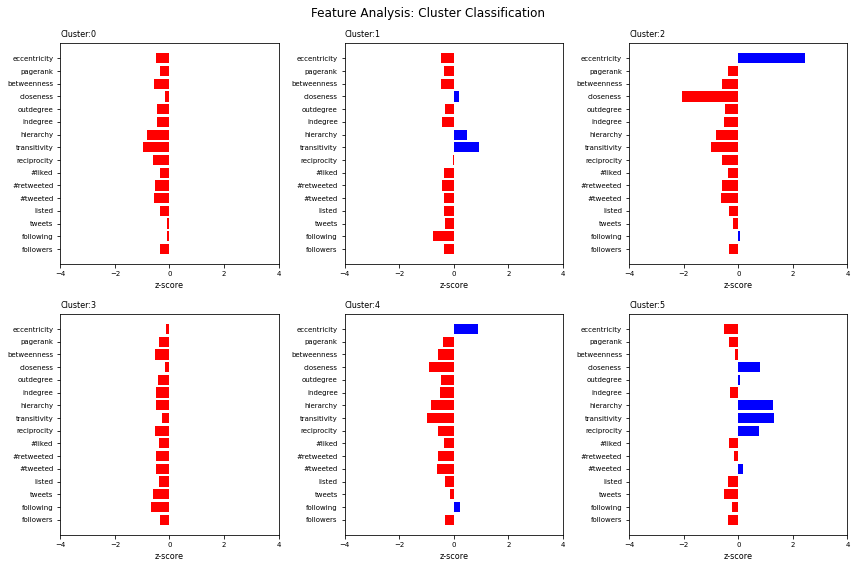

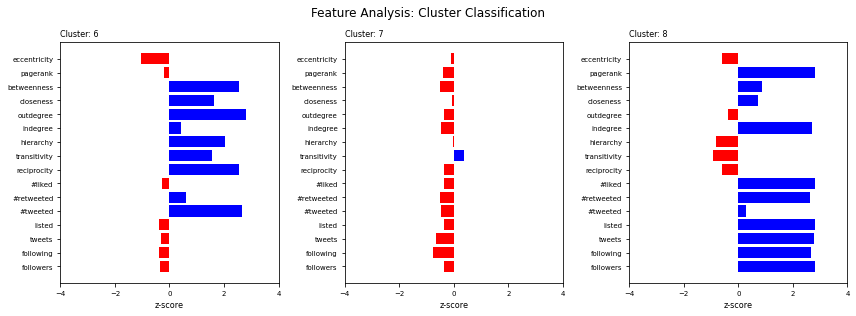

In [7]:
#
# CLUSTER CLASSIFICATION MEAN-SCORE PLOTS
#n_clust = 8 
kmeans_sel = KMeans(init='k-means++', n_clusters=n_clust, n_init=100, random_state=1).fit(scaled_feat)
labels = pd.DataFrame(kmeans_sel.labels_)
df_clust = df_sen_1.assign(Cluster=labels)

# Calculate cluster means and zscores
kmeans_clust = df_clust.groupby(['Cluster']).mean()
#print(kmeans_clust)
df_zmean_clust= kmeans_clust.loc[:,feat_cols].apply(stats.zscore)
df_zmean_clust.reset_index(inplace=True)
#print(df_zmean_clust)

# Plot grouped feature bar charts
def feature_plots(df, n_clusters):
    plt.rcParams["figure.figsize"]=[12,8]
    #plt.rcParams["figure.autolayout"] =True
    plot_range =[range(0,6),range(6,12)]
    c= (n_clusters//6)+1
    for r in range(0,c):
        for i in plot_range[r]:
            if i < n_clusters:
                x_cols = df.loc[:,feat_cols].values.tolist()[i]
                col=[]
                for val in x_cols:
                    if val < 0:
                        col.append('red')
                    else:
                        col.append('blue')

                y = feat_cols
                x = list(x_cols)

                if i in plot_range[0]:
                    n='a'
                    plt.subplot(2,3,i+1)
                    plt.title("Cluster:"+str(i), fontsize=8, loc='left')
                elif i in plot_range[1]:
                    n='b'
                    i_2 = i-6
                    plt.subplot(2,3,i_2+1)
                    plt.title("Cluster: "+str(i), fontsize=8, loc='left')

                plt.xlim(-4,4)
                plt.barh(y,x, color=col)
                plt.yticks(fontsize=7)
                plt.xticks(fontsize=7)
                plt.xlabel('z-score', fontsize=8)

        plt.suptitle('Feature Analysis: Cluster Classification')
        plt.tight_layout()
        #plt.savefig("{}".format(gpath) + x + "_cluster_feature_wr_" + n + ".png")
        plt.show()

feature_plots(df_zmean_clust, n_clust)


At k-cluster=9, 3 distinct clusters are detected. The remaining 6 exhibit non-distinct or low value features. Non-disinct clusters are therefore labelled as **Minor** types, while the 3 distinct clusters are labelled as such:

1. **Observer** -> periphery users that are far away from the centre of the discourse and have little participation or involvement.


2. **Activator** -> active and bridge users that reply to tweets and have a high interaction and engagement with other users, whilst having a wide reach in spreading information across network.


3. **Leader** -> popular and public users who have many followers, are publicly listed and have a high global tweet count, that receive many replies to tweets and interact mainly with other users of similar status.

Below, I list the cluster sizes and usernames of members assigned to each distinct cluster group. I also re-plot the mean scores to include only the disctinct clusters. 

In [8]:
#
# CLUSTER DESCRIPTION
# calculate cluster sizes
df_g_clust = df_clust[['id','Cluster']]
print("\n" + "--------" + "\n" + '\033[1m' + "K-Cluster Sizes:")
print("------------------------" + "\n")
print(df_g_clust.groupby('Cluster').count())
print("------------------------")
# Not surprising that there is large variation in cluster weight. Certain roles of (e.g. roles authority) are in the form of hierarchal structures. 


--------
K-Cluster Sizes:
------------------------

           id
Cluster      
0        2027
1         408
2         534
3         424
4        2625
5         200
6          66
7         370
8          21
------------------------


In [9]:
#
#Cluster 2
print("\n" + "--------" + "\n" + '\033[1m' + "K-Cluster Types:")
print("------------------------")
df_c2 =df_clust.loc[df_clust['Cluster']==clust_sel[0]]
print("\n" + "--------" + "\n" +'\033[1m' + 'Cluster ' + str(clust_sel[0]) + ': Observer' + '\033[0m')
print("--------"+ "\n")
#print(df_c6.loc[:,['id']].reset_index(drop=True).count())
print("List too large to display")
print("\n" + '\033[1m' + 'Features: +ve eccentricity and -ve closeness' + '\033[0m')
print("------------------------")


--------
K-Cluster Types:
------------------------

--------
Cluster 2: Observer
--------

List too large to display

Features: +ve eccentricity and -ve closeness
------------------------


In [10]:
#
#Cluster 6
#print("\n" + "--------" + "\n" + '\033[1m' + "K-Cluster Types:")
#print("--------")
df_clust.sort_values(['outdegree', 'hierarchy', 'transitivity', 'reciprocity', '#tweeted', 'betweenness', 'closeness'], inplace=True, ascending=False)
df_c6=df_clust.loc[df_clust['Cluster']==clust_sel[1]]
print("\n" + "--------" + "\n" + '\033[1m' + 'Cluster ' + str(clust_sel[1]) + ': Activator' + '\033[0m')
print("--------"+ "\n")
print(df_c6.loc[:,['label']].reset_index(drop=True))
print("\n" + '\033[1m' + 'Features: +ve betweenness, closeness, outdegree, hierarchy, transitivity, reciprocity, #tweeted*' + '\033[0m')
print("------------------------")
print('*Table list is sorted by feature values.')
#df_c6.loc[:,['id','label','outdegree', 'hierarchy', 'transitivity', 'reciprocity', '#tweeted', 'betweenness', 'closeness']].reset_index(drop=True)
#betweenness -> MEB40122141, BFSF1212, Shokwakhe16, JayMzansi10, TopThestreets
#outdegree -> JayMzansi10, WolfDen12427788, Motheo2009, peezyjr, Custoza1
#tweeted -> MEB40122141, BFSF1212, masotobe39, JayMzansi10, ThaboSchoeman


--------
Cluster 6: Activator
--------

              label
0       JayMzansi10
1   WolfDen12427788
2        Motheo2009
3           peezyjr
4          Custoza1
5     Light50995046
6       MEB40122141
7    Khadijahhosana
8      Africanist14
9     nellyngwenya7
10        aredi1234
11        PNMaster_
12  Ashante14527204
13         BFSF1212
14         Nkweeng1
15     BrandonKaule
16     Mamotlokoa02
17    Great_lioness
18   Mashabela_Paul
19       happyerics
20  Khumbuz98119386
21   Island_Tribe17
22     Fokazingzing
23    TopThestreets
24        TjRaisibe
25    CynthiaTshaka
26          tchuene
27  6b0594175411491
28    Indigenous_SA
29   PatrioticOneSA
30    better_SA_fan
31       Kelebile14
32    ThaboSchoeman
33         bushyza1
34      OfNkululeko
35          lyrlady
36        ladycovid
37        Noma_7006
38       sepedirock
39     siza_mhayise
40          Pheaga1
41      Shokwakhe16
42         nanoza23
43      Sipho_Nkosi
44   Galela15505225
45    Ingonyama1993
46    Sesie52422225

In [11]:
#
#Cluster 8
#print("\n" + "--------" + "\n" + '\033[1m' + "K-Cluster Types:")
#print("--------")
df_clust.sort_values(['pagerank', 'indegree', '#liked', '#retweeted', 'listed', 'tweets', 'following', 'followers'], inplace=True, ascending=False)
df_c8=df_clust.loc[df_clust['Cluster']==clust_sel[2]]
print("\n" + "--------" + "\n" +'\033[1m' + 'Cluster ' + str(clust_sel[2]) + ': Leader' + '\033[0m')
print("--------"+ "\n")
print(df_c8.loc[:,['label']].reset_index(drop=True))
print("\n" + '\033[1m' + 'Features: +ve pagerank, indegree, #liked, #retweeted, listed, tweets, following, followers' + '\033[0m')
print("------------------------")
print('*Table list is sorted by feature values.')
#df_c8.loc[:,['id','label','pagerank', 'indegree', '#liked', '#retweeted', 'listed', 'tweets', 'following', 'followers']].reset_index(drop=True)


--------
Cluster 8: Leader
--------

              label
0   MbuyiseniNdlozi
1     Lerato_Pillay
2    EFFSouthAfrica
3    CyrilRamaphosa
4     AdvoBarryRoux
5     HermanMashaba
6     MbalulaFikile
7   Julius_S_Malema
8       ZungulaVuyo
9    casspernyovest
10     MmusiMaimane
11           News24
12         Abramjee
13    KimKardashian
14         akreana_
15           davido
16         elonmusk
17  TiAmoNtombonina
18     RudyGiuliani
19        Cristiano
20        wizkidayo

Features: +ve pagerank, indegree, #liked, #retweeted, listed, tweets, following, followers
------------------------
*Table list is sorted by feature values.


#### 3.1. Mean Score Plots (excl. Minor)

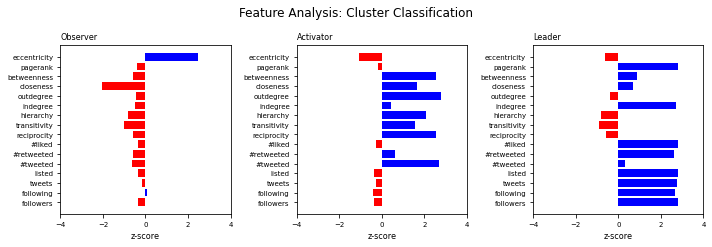

In [12]:
#
# CLUSTER CLASSIFICATION: MEAN-SCORE PLOTS
#clust_sel = [[9,6,7,8,4],[9,6,4]]
df_clust.sort_values(['index'], inplace=True, ascending=True)
# Identified a minimum of 3 distinct roles based on features consistent with positional characteristics of other networks

def cluster_type_3(value):
    if value == clust_sel[0]:
        return "Observer"
    elif value == clust_sel[1]:
        return "Activator"
    elif value == clust_sel[2]:
            return "Leader"
    else:
        return "Minor"
    
    
# Add position category to dataframe
#for c in clust_sel:
#    if len(c) == 3:
df_clust['Position_3'] = df_clust.apply(lambda row: cluster_type_3(row['Cluster']), axis=1)
df_zmean_clust['Position_3'] = df_zmean_clust.apply(lambda row: cluster_type_3(row['Cluster']), axis=1)
df_clust.to_csv("putsafirst_kmeans_1.csv", sep=";",encoding='utf-8',  index=False)
#print(df_clust.info())	
#print(df_zmean_clust.info())


def feature_sel_plots(df, clusters):
    #plt.rcParams["figure.autolayout"] =True
    plt.rcParams["figure.figsize"]=[10,6]
    clust_range =[range(0,6),range(6,12)]
    c= (len(clusters)//6)+1
    for r in range(0,c):
        for i in clust_range[r]:
            if i < len(clusters):
                x_cols = df.loc[:,feat_cols].values.tolist()[clusters[i]]
                x_rol = df[df['Cluster']==clusters[i]]
                role = x_rol.Position_3.item()  
                col=[]
                for val in x_cols:
                    if val < 0:
                        col.append('red')
                    else:
                        col.append('blue')

                y = feat_cols
                x = list(x_cols)

                plt.subplot(2,3,i+1)
                #plt.title("Cluster:"+str(clusters[i]), fontsize=8, loc='left')
                plt.title(role, fontsize=8, loc='left')

            plt.xlim(-4,4)
            plt.barh(y,x, color=col)
            plt.yticks(fontsize=7)
            plt.xticks(fontsize=7)
            plt.xlabel('z-score', fontsize=8)

        plt.suptitle('Feature Analysis: Cluster Classification')
        plt.tight_layout()
        #plt.savefig("{}".format(gpath) + x + "_cluster_type_wr_.png")
        #plt.savefig("{}".format(gpath) + x + "_cluster_type_wr_.pdf")
        plt.show()

feature_sel_plots(df_zmean_clust, clust_sel)

----------------------------------------------------------
#### 4. EVALUATION




Using pythons seaborn library, I plot the pairwise relationships of detected clusters to assess the fit of nodes within a cluster and the relationships between nodes and their features. 

To interpret the results, lets say we want to consider the relationship between a node's distance from other nodes in the network and the probability of being added to a public list. From the plot, this can be found where the *closeness* feature on the y-axis meets the *listed* feature on the x-axis. Here, we fail to find a significant distinction in being publicly listed for nodes in the different clusters, except maybe for a few stray nodes in the *Leader* cluster. It is also evident that *Activator* nodes are positioned close to conversations in the discourse. Similary, when viewing the relationship between *indegree* and *pagerank*, not much seperation between node attributes exists except for a few *Leader* type nodes with exceptionally high *indegree* values. The *#retweeted* and *#liked* relationship appears to record high values for *Leader* types, showing a positve relationship between their discourse related tweets being retweeted and being liked. *Activator* clusters are significantly distinct across *outdegree*, *transitivity*, *reciprocity*, and *hierarchy* features.

#### 4.1. Pairwise Relationship Plots

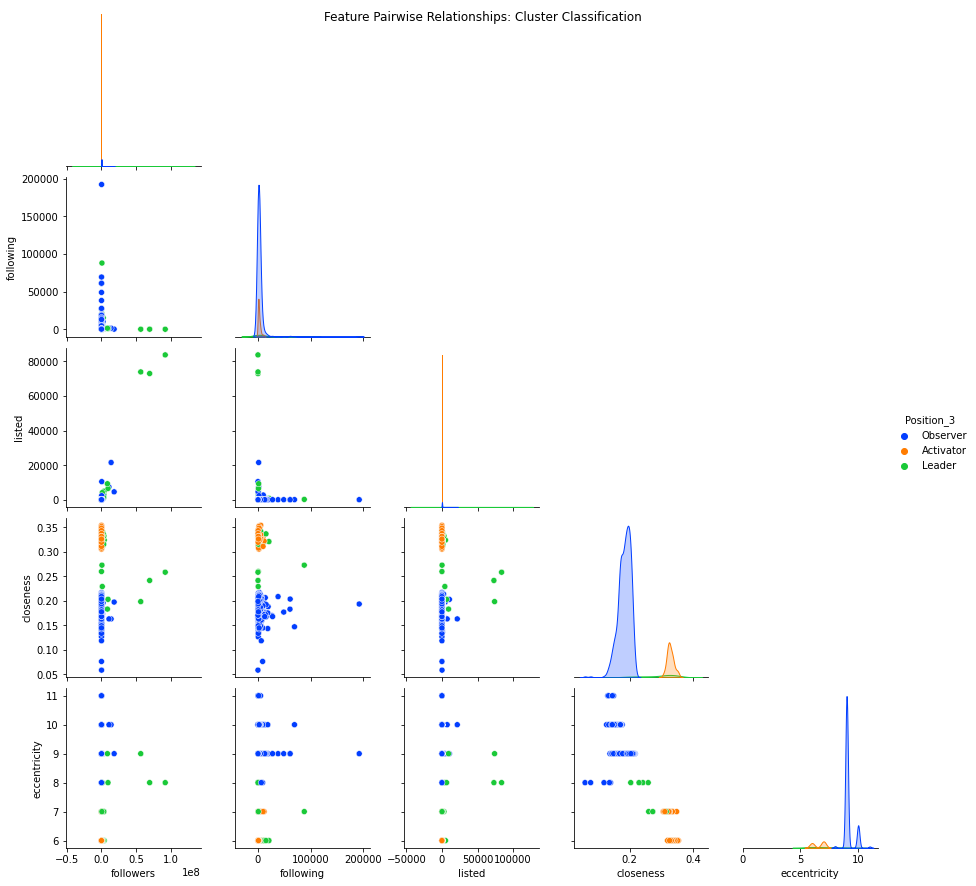

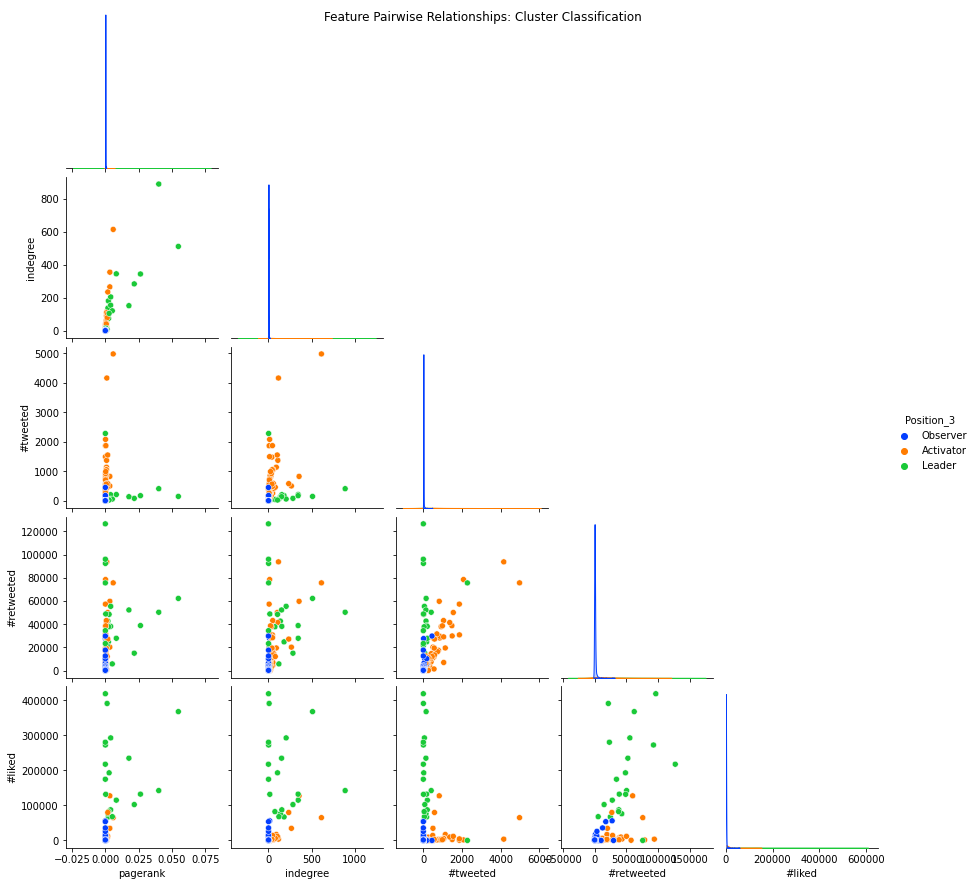

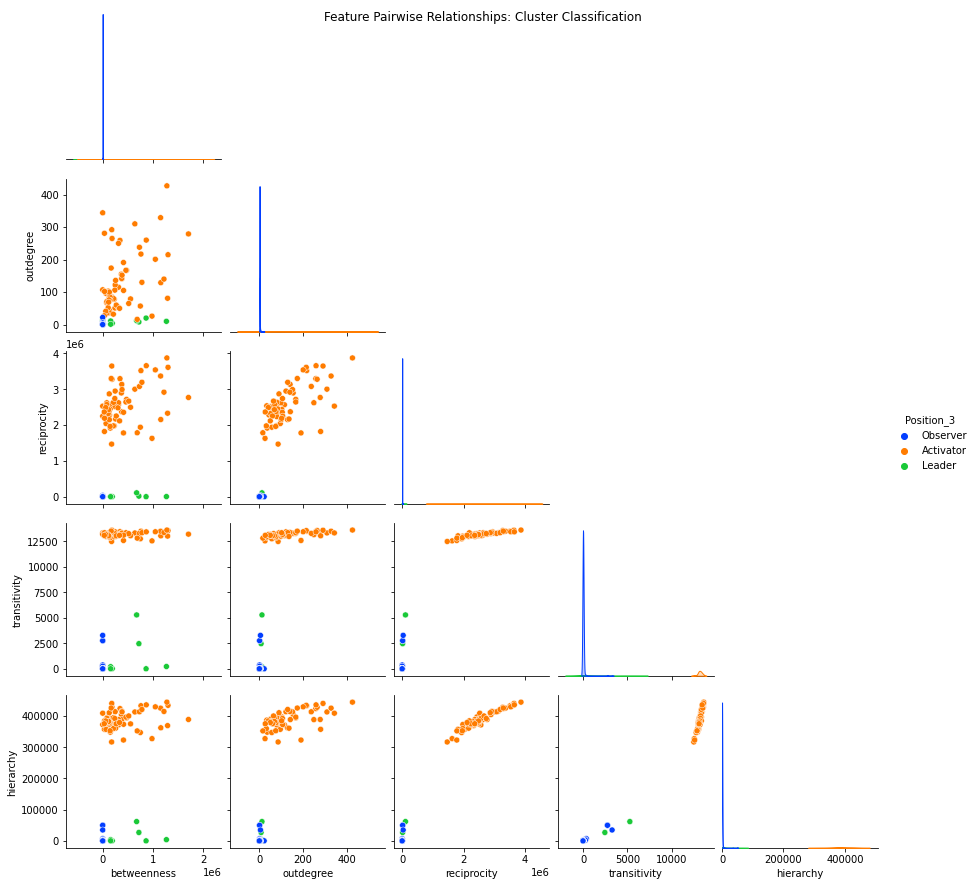

In [13]:
#
# CLUSTER CLASSIFICATION PAIRWISE PLOTS
feat_dict = {
        'a':['followers','following','listed', 'closeness', 'eccentricity'],
        'b':['pagerank','indegree', '#tweeted','#retweeted','#liked'],
        'c':['betweenness','outdegree','reciprocity','transitivity','hierarchy']
        }

#Graph with maximum limit of unique clusters
#for c in clust_sel:
#    if len(c) == 3 :

clust_role=["Observer","Activator","Leader"]

for k,v in feat_dict.items():

    plt.rcParams["figure.autolayout"] =True
    plt.rcParams["figure.figsize"]=[8,8]
    sns.pairplot(df_clust.loc[df_clust['Cluster'].isin(clust_sel)],hue='Position_3',hue_order=clust_role,vars=v,palette=sns.color_palette('bright',len(clust_role)), corner=True)
    plt.suptitle('Feature Pairwise Relationships: Cluster Classification')
    plt.xlim(left=0)
    #plt.savefig("{}".format(gpath) + x + "_feature_pairwise_5_wr_" + str(k) + ".png")
    #plt.savefig("{}".format(gpath) + x + "_feature_pairwise_5_wr_" + str(k) + ".pdf")
    plt.show()


----------------------------------------------------------------------------------
#### 5. SUMMARY


In this section, I use feature based techniques to conduct analysis on the positions and roles that define users in the #PutSAFirst twitter reply network. Below is a summary of notable findings.

I identify 3 distinct clusters that fairly categorise the roles one could expect from a discourse network on a social media platform like Twitter and classify them as such:

1. **Observer** -> periphery users that are far away from the centre of the discourse and have little participation or involvement.


2. **Activator** -> active and bridge users that reply to tweets and have a high interaction and engagement with other users, whilst having a wide reach in spreading information across network.


3. **Leader** -> popular and public users who have many followers, are publicly listed and have a high global tweet count, that receive many replies to tweets and interact mainly with other users of similar status.

Unlike the 5 distinct roles detected in the other online discourses, this network only produces 3 distinct roles. This is possibly explained by its higher clustering property, and therefore a higher incident of redundant ties. It might be that there is a large duplication in the roles prominent users play in this network and therefore very little separation is detected between activities. Another possibility is that the feature based technique used in this analysis are somewhat limited. Thus it might benefit to compare it to outcomes from other network clustering methods, like **blockmodelling**.

The presence of outliers can also significantly affect outcomes. In the observed network, the effect of high status individuals and celebrities on clustering is very evident in the *Leader* role. For example, just by looking, users in this role can be split into two different types. One type represents the (locally) popular users who are important within the discourse. They display high measures of *pagerank*, *indegree*, *#liked*, and *#retweeted*. Prominent users who have managed to achieve a large influence within the discourse, for example, are **Lerato_Pillay**, **MbuyiseniNdlozi**, **HermanMashaba**, **EFFSouthAfrica**, and **CyrilRamaphosa**. Conversely, the other type are (globally) popular users who are not actively contributing to the discussion but happen to be public figures. The latter account for large values in *listed*, *tweets*, *following*, and *followers* features. A commonly used ploy or device to bring awareness to a certain movement or increase visibility in online social media is to tag or reply to (unrelated) tweets sent by public figures with a message related to the cause. Hence, the addition of users **KimKardashian**, **elonmusk**, **RudyGiuliani**, and **Cristiano** in this network. One option to deal with these types of outlier effects and achieve more consistent and accurate results is to remove them from the data completely and assess the difference in clustering outcomes. This is beyond the scope of the current analysis.

In the *Activator* role, I find the user **JayMzansi10** leading in  *outdegree*, *hierarchy*, *transitivity*, *reciprocity* features. Other highly active accounts are **WolfDen12427788**, **Motheo2009**, **peezyjr**, and **Custoza1**. These are all accounts that are strongly in support of the movement and whose strongly worded tweets also include the shaming of dissenters and exposition of illegal immigrant "sympathisers".

In the next section, I simulate multiple diffusion processes using the discourse network to determine whether certain positions in highly clustered communities promote or hinder the spread of information and ideas.

In [2]:
print("\n" + "--------" + "\n" + '\033[1m' + 'PutSAFirst Positions:' + '\033[0m' + "\n")
display(SVG(filename="putsafirst_kmeans_1_2.svg"))


--------
PutSAFirst Positions:

